# Stanford Dog Dataset Exploration

In [1]:
# imports
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

import torchvision.transforms as transforms
from torchvision import datasets
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.transforms.functional as TF
import torch

import warnings
warnings.filterwarnings('ignore')

import utils
import config

import importlib
importlib.reload(config)
importlib.reload(utils)

# download data
utils.download_and_extract_tar(url = config.STANFORD_DOG_DATASET_URL, extract_to='.', rename_folder_to='stanford-dog-dataset')

The folder ./stanford-dog-dataset already exists.


## Distribution of Images Per Dog Breed

In this plot, we try to understand how many images we already have per class.

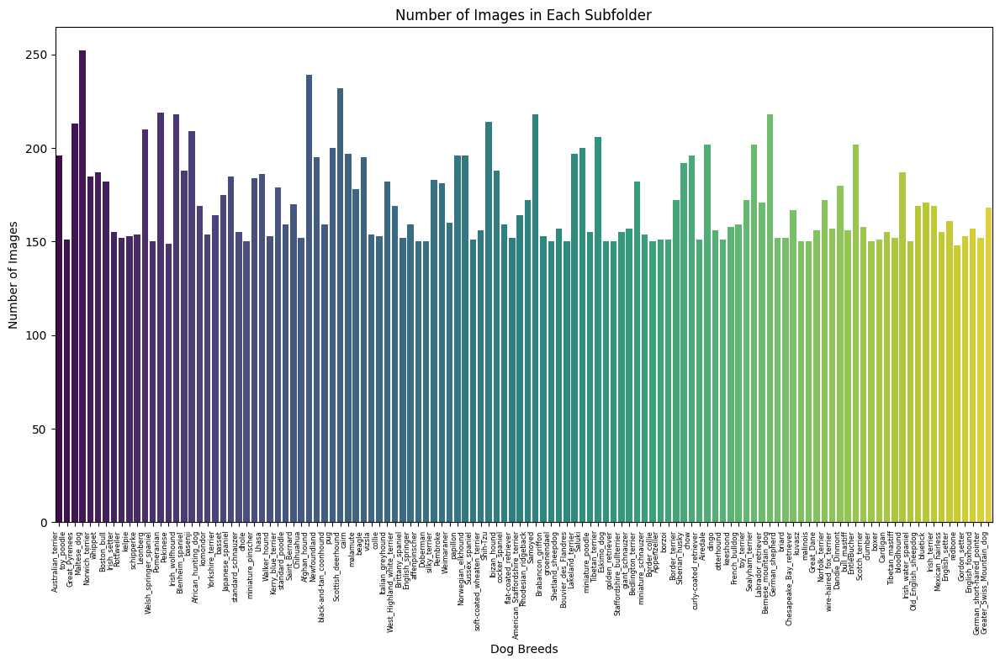

In [2]:
image_extensions = {'.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff'}
image_counts = {}

for subdir, _, files in os.walk(config.STANFORD_DOG_DATASET_LOCAL_PATH):
    # Get the relative path of the subdirectory
    relative_path = os.path.relpath(subdir, config.STANFORD_DOG_DATASET_LOCAL_PATH)
    if relative_path == '.':
        continue  # Skip the main directory itself
            
    # Count image files in the subdirectory
    image_count = sum(1 for file in files if os.path.splitext(file)[1].lower() in image_extensions)
    image_counts[relative_path] = image_count

# Convert the dictionary to a DataFrame
df = pd.DataFrame(list(image_counts.items()), columns=['Subfolder', 'Image Count'])

# Plot the bar graph
plt.figure(figsize=(12, 8))
sns.barplot(x='Subfolder', y='Image Count', data=df, palette='viridis')
plt.xticks(rotation=90, ha='right', fontsize = 6)
plt.xlabel('Dog Breeds')
plt.ylabel('Number of Images')
plt.title('Number of Images in Each Subfolder')
plt.tight_layout()  # Adjust layout to prevent clipping of tick-labels
plt.show()

## Common and Least Common Breeds

In [3]:
# Sort the dictionary by values (number of images) in descending order
sorted_breeds = sorted(image_counts.items(), key=lambda x: x[1], reverse=True)

# Extract the top 10 most common breeds
top_10_common = [breed for breed, count in sorted_breeds[:10]]

# Extract the bottom 10 least common breeds
bottom_10_common = [breed for breed, count in sorted_breeds[-10:]]

print('Number of Dog Breeds (Categories):', len(sorted_breeds))

print('10 Most Common Dog Breeds in Dataset:')
for breed in top_10_common:
    print(breed)

print('\n10 Least Common Dog Breeds in Dataset:')
for breed in bottom_10_common:
    print(breed)

Number of Dog Breeds (Categories): 120
10 Most Common Dog Breeds in Dataset:
Maltese_dog
Afghan_hound
Scottish_deerhound
Pomeranian
Irish_wolfhound
Samoyed
Bernese_mountain_dog
Shih-Tzu
Great_Pyrenees
Leonberg

10 Least Common Dog Breeds in Dataset:
Bouvier_des_Flandres
Eskimo_dog
golden_retriever
Border_collie
kuvasz
malinois
clumber
Irish_water_spaniel
Pekinese
redbone


## Visualize Sample Images

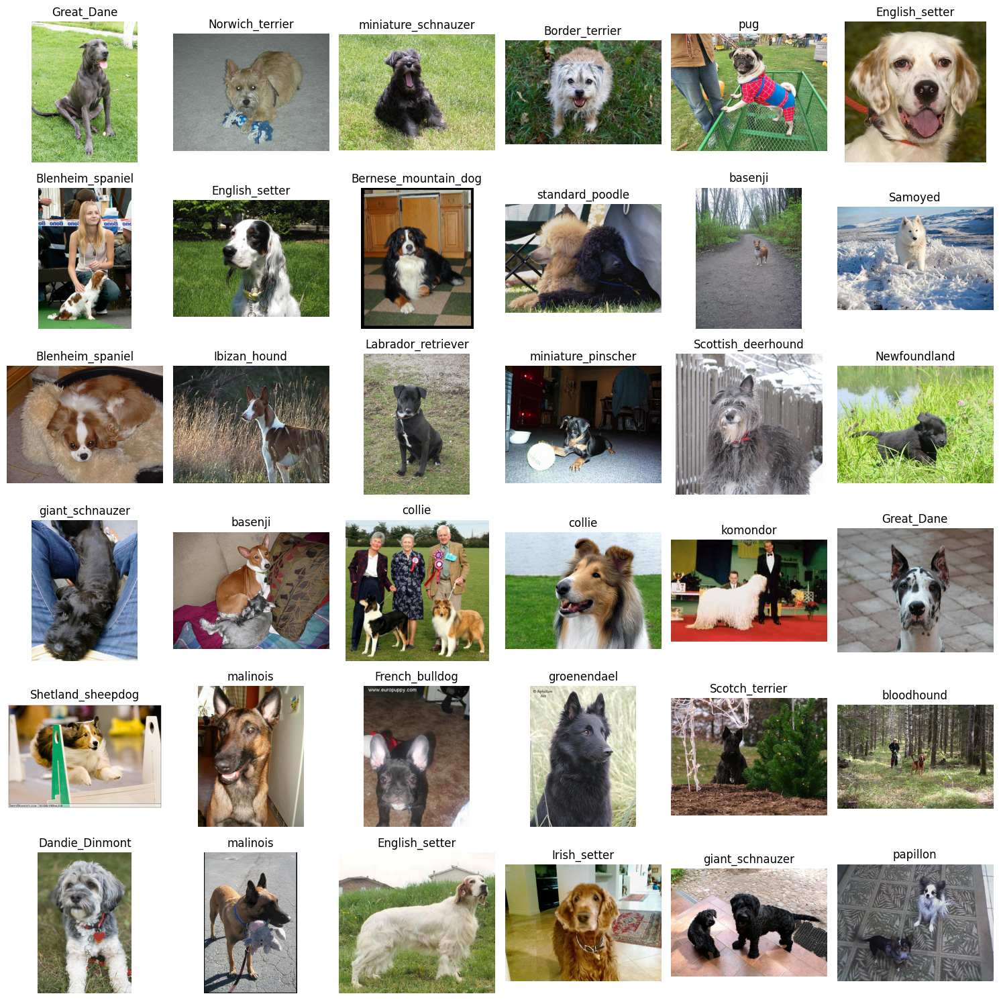

In [4]:
# Create the ImageFolder dataset
dataset = ImageFolder(root=config.STANFORD_DOG_DATASET_LOCAL_PATH)

# Create a figure and axis object
fig, axs = plt.subplots(6, 6, figsize=(15, 15))

# Flatten the axis object for easier indexing
axs = axs.ravel()

# Iterate over 36 random images from the dataset
for i in range(36):
    # Get a random image and its label
    idx = torch.randint(len(dataset), (1,)).item()
    image, label = dataset[idx]

    # Convert tensor to numpy array and transpose the dimensions
    image_np = np.array(image)  # Convert to numpy array

    # Display the image with its label
    axs[i].imshow(image_np)
    axs[i].set_title(dataset.classes[label])
    axs[i].axis('off')

 # Adjust layout
plt.tight_layout()
plt.show()

## Visualize Sample Images After Transformation
Visualize Tranforms for ViT Classification Models

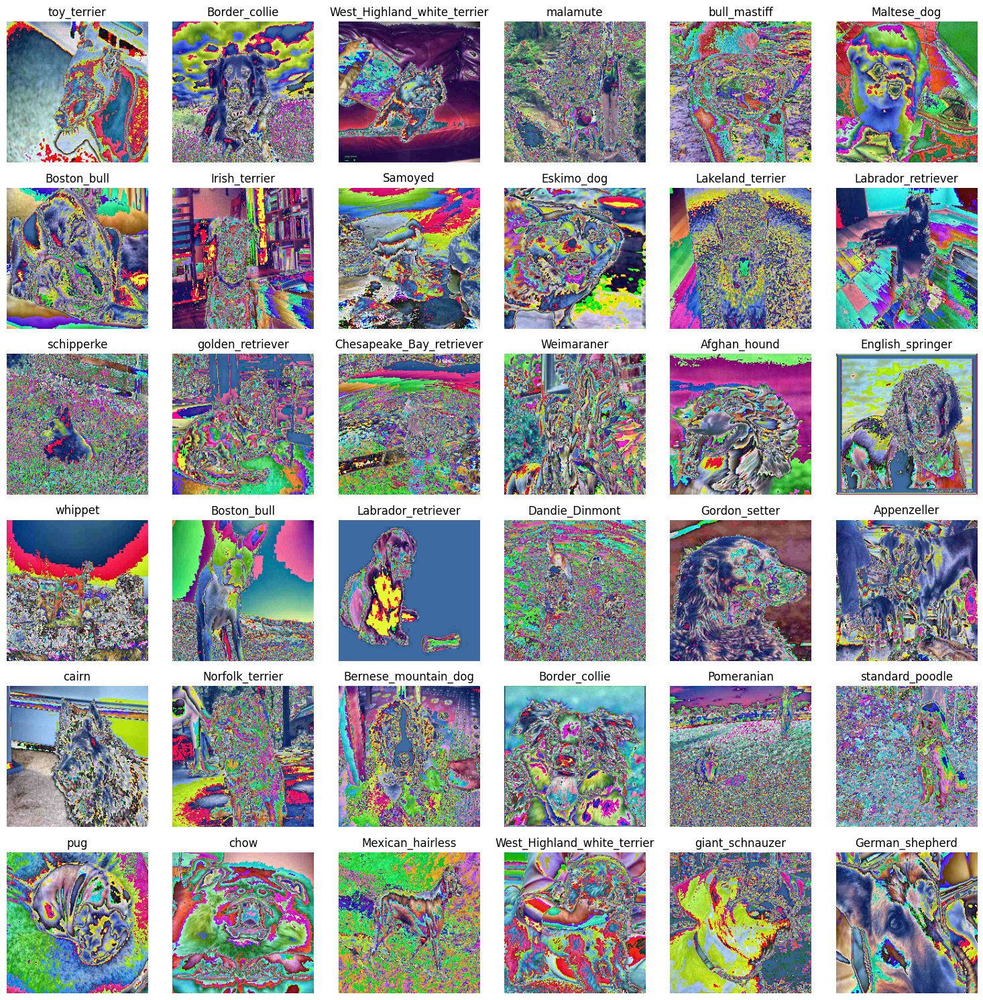

In [7]:
# Define the transformations to apply to the images (resize, normalize, etc.)
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # Resize images to 256x256
    transforms.RandomHorizontalFlip(),      # Crop the center 224x224 region
    transforms.ToTensor(),           # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet mean and std
])

# Create the ImageFolder dataset
dataset = ImageFolder(root=config.STANFORD_DOG_DATASET_LOCAL_PATH, transform=transform)

# Create a figure and axis object
fig, axs = plt.subplots(6, 6, figsize=(15, 15))

# Flatten the axis object for easier indexing
axs = axs.ravel()

# Iterate over 36 random images from the dataset
for i in range(36):
    # Get a random image and its label
    idx = torch.randint(len(dataset), (1,)).item()
    image, label = dataset[idx]

   # Convert tensor to numpy array and transpose the dimensions
    image_np = TF.to_pil_image(image)  # Convert to PIL Image
    image_np = np.array(image_np)  # Convert to numpy array
    # image_np = image_np.transpose(1, 2, 0)  # Transpose dimensions from (C, H, W) to (H, W, C)


    # Display the image with its label
    axs[i].imshow(image_np)
    axs[i].set_title(dataset.classes[label])
    axs[i].axis('off')

 # Adjust layout
plt.tight_layout()
plt.show()